In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import transforms
import torchvision.transforms.v2.functional as TF
from sklearn.model_selection import train_test_split, KFold
from torchmetrics.functional import dice
import cv2
import pandas as pd

import segmentation_models_pytorch as smp
from segmentation_models_pytorch.encoders import get_preprocessing_fn

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from tqdm import tqdm
import random
import PIL

from utils.early_stopping import EarlyStopping

import wandb

from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, LayerCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

/cs/student/projects1/2021/izaffar/miniconda3/envs/fyp/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
torch.hub.set_dir('/cs/student/projects1/2021/izaffar/.cache/torch/hub')

In [3]:
DATA_DIR = "../data"
for filename in os.listdir(DATA_DIR):
    print(filename)

images_best_slice
images_slices
info.csv
masks_both
masks_right
mul_mm.png
masks_area
masks_both_w2
masks_both_w3
masks_right_w2
masks_right_w3
bob.py


In [4]:
# Use GPU
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(DEVICE)

cuda


In [5]:
# Cublas ting
os.environ["CUBLAS_WORKSPACE_CONFIG"]=":4096:8"

In [59]:
def set_seed(seed: int = 42) -> None:
    np.random.seed(seed)
    # random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # Determinism
    torch.use_deterministic_algorithms(True, warn_only=True)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")


In [22]:
# Custom Dataset class
class CustomDataset(Dataset):
    def __init__(self, data_dir, indices, model_name, mask_type, transform=False, device="cpu"):
        self.data_dir = data_dir
        self.model_name = model_name
        self.transform = transform
        self.device = device

        self.csv_path = os.path.join(data_dir, "info.csv")
        self.data_df = pd.read_csv(self.csv_path)
        self.data_df = self.data_df.iloc[indices]

        # image dir
        self.image_dir = os.path.join(data_dir, "images_best_slice")
        self.image_files = np.array(sorted(os.listdir(self.image_dir)))[indices]

        # mask dir
        self.mask_dir = os.path.join(data_dir, f"masks_{mask_type}")
        self.mask_files = np.array(sorted(os.listdir(self.mask_dir)))[indices]

        assert len(self.image_files) == len(self.data_df)

    def slice_transform(self, slice_image):
        if self.model_name == "brain_mri":
            m, s = np.mean(slice_image, axis=(0, 1)), np.std(slice_image, axis=(0, 1))
            preprocess = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.CenterCrop((256, 256)),
                    transforms.Normalize(mean=m, std=s),
                    # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
                ]
            )
            input_tensor = preprocess(slice_image)
        else:
            # stack image 3 channels rgb
            # slice_image = np.stack((slice_image,) * 3, axis=-1)
            
            preprocess = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.CenterCrop((320, 320)),
                    # transforms.Normalize(mean=m, std=s),
                ]
            )
            input_tensor = preprocess(get_preprocessing_fn(self.model_name)(slice_image))
        return input_tensor

    def data_aug_transform(self, image, mask, mul):
        # Random horizontal flipping
        if random.random() > 0.5:
            # print("hflip")
            image = TF.hflip(image)
            mask = TF.hflip(mask)

        # Random vertical flipping
        if random.random() > 0.5:
            # print("vflip")
            image = TF.vflip(image)
            mask = TF.vflip(mask)
        
        # # Random zoom in
        # if random.random() > 0.5:
        #     # print("zoom")
        #     scale = random.uniform(0.9, 1.1)
        #     image = TF.resized_crop(image, 0, 0, int(320*scale), int(320*scale), (320, 320))
        #     mask = TF.resized_crop(mask, 0, 0, int(320*scale), int(320*scale), (320, 320))
        #     mul *= scale
        
        return image, mask, mul

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        mul = self.data_df["mul_mm"].values[idx]
        # patient_id_df = self.data_df["patient_id"].values[idx]
        # patient_id_img = self.image_files[idx]
        # print(patient_id_df, patient_id_img)
        
        # Load image and mask
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_files[idx])
        # image = np.load(image_path).astype(np.float32)
        # mask = np.load(mask_path).astype(np.float32)
        image = PIL.Image.fromarray(np.load(image_path).astype(np.float32))
        mask = PIL.Image.fromarray(np.load(mask_path).astype(np.float32))

        # data augmentation
        if self.transform:
            image, mask, mul = self.data_aug_transform(image, mask, mul)

        if self.model_name == "brain_mri":
            image = self.slice_transform(image).to(self.device)
            mask = self.mask_transform(mask).to(self.device)
        else:
            # print(image.min(), image.max())
            # image = np.stack((image,) * 3, axis=-1) # stack image 3 channels rgb
            image = (image - np.min(image)) / (np.max(image) - np.min(image))
            # print(image.min(), image.max())
        
            standard_transform = transforms.Compose(
                [
                    transforms.ToTensor(),
                    transforms.v2.CenterCrop((320, 320)),
                    # transforms.v2.Normalize(mean=[0.5], std=[0.5]),  # Normalize to [-1, 1] range
                    # transforms.v2.ToDtype(torch.float32, scale=True),
                    # transforms.CenterCrop((320, 320)),  # Center crop to (320, 320)
                    # transforms.ToTensor(),               # Convert to tensor
                ]
            )
            image = standard_transform(image)
            image = image.repeat(3,1,1)
            # print(image.min(), image.max())
            # plt.imshow(image.permute(1,2,0).cpu().numpy(), cmap="gray")
            # plt.show()
            image = image.to(self.device)
            mask = standard_transform(mask).to(self.device)
        mul = torch.tensor(mul, dtype=torch.float).to(self.device)
        
        return {"image": image, "mask": mask, "mul": mul}


In [45]:
brain_unet_model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
        in_channels=3, out_channels=1, init_features=32, pretrained=True).to(DEVICE)
new_in_channels = 1
modified_encoder1_weight = brain_unet_model.encoder1.enc1conv1.weight.data[:, :new_in_channels, :, :]
brain_unet_model.encoder1.enc1conv1 = nn.Conv2d(new_in_channels, 32, kernel_size=3, padding=1)
brain_unet_model.encoder1.enc1conv1.weight.data = modified_encoder1_weight

# Define your new model by extending the loaded model
class BrainMRIUNetFC(nn.Module):
    def __init__(self, base_model):
        super(BrainMRIUNetFC, self).__init__()
        self.base_model = base_model

        output_features = 256 * 256
        self.final = nn.Sequential(
            nn.Flatten(),
            nn.Linear(output_features, 1)  # Fully connected layer with a single node
        )

    def forward(self, x):
        # Forward pass through the base model
        x = self.base_model(x)

        # Apply your new layer
        x = self.final(x)

        return x

# Load the pre-trained model
def get_model(model_type, device="cpu"):
    if model_type == "brain_mri":
        return BrainMRIUNetFC(base_model=brain_unet_model).to(device)
    elif model_type == "resnet50":
        model = models.resnet50(weights='DEFAULT')
        for param in model.parameters():
            param.requires_grad = False
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, 1)
        return model.to(DEVICE)
    elif model_type == "vgg16":
        model = models.vgg16_bn(weights='DEFAULT')
        num_features = model.classifier[0].in_features  # Grab the number of input features to the last layer
        model.classifier = nn.Linear(num_features, 1)  # Output a single value for regression
        # Optionally, you might want to freeze the features layers during training
        for param in model.features.parameters():
            param.requires_grad = False
        return model.to(device)
    else:
        raise ValueError("Model type not found")

Using cache found in /cs/student/projects1/2021/izaffar/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master


In [9]:
def convert_pixels_to_mm(length_pixels, resized_image_width_pixels=320, required_image_width_pixels=320, scale_factor=0.56525):
    # image_width_pixels = image.size(2)
    length_mm = length_pixels * (required_image_width_pixels / resized_image_width_pixels) * scale_factor
    return length_mm

def get_length_line_simple(masks):
    batch_size, _, image_width, image_height = masks.size()
    masks = masks.squeeze(1)
    lengths = []

    for i in range(batch_size):
        mask = masks[i]  # Select the mask for the current sample
        
        # Find indices of non-zero elements (where the mask is 1)
        nonzero_indices = torch.nonzero(mask, as_tuple=False)
        
        if len(nonzero_indices) > 0:
            # Compute the bounding rectangle from the non-zero indices
            x, y, w, h = cv2.boundingRect(nonzero_indices.cpu().numpy())
            
            # Calculate the diagonal length of the bounding rectangle
            diagonal_length = torch.sqrt(torch.tensor(w**2 + h**2, dtype=torch.float32))
            diagonal_length_mm = convert_pixels_to_mm(diagonal_length)
            lengths.append(diagonal_length_mm)
            
            # # Compute the bounding box from the non-zero indices
            # min_x = nonzero_indices[:, 1].min().item()
            # min_y = nonzero_indices[:, 0].min().item()
            # max_x = nonzero_indices[:, 1].max().item()
            # max_y = nonzero_indices[:, 0].max().item()

            # # Calculate the diagonal length of the bounding box
            # width = max_x - min_x
            # height = max_y - min_y
            # diagonal_length = torch.sqrt(torch.tensor(width**2 + height**2, dtype=torch.float32))
            # diagonal_length_mm = convert_pixels_to_mm(diagonal_length, image_width)
            # lengths.append(diagonal_length_mm)
        else:
            lengths.append(torch.tensor(0.0))  # If no non-zero elements found, return length 0

    return torch.stack(lengths)


In [24]:
def get_data(model_name, mask_type, val_size, test_size, batch_size, data_aug=False):
    image_dir = os.path.join(DATA_DIR, "images_best_slice")
    data_count = len(os.listdir(image_dir))
    # print(data_count)
    
    # Split the data into temporary and test data
    train_val_indices, test_indices = train_test_split(
        list(range(data_count)), test_size=(test_size/100), random_state=42
    )

    # Split the temporary data into training and validation
    train_indices, val_indices = train_test_split(
        train_val_indices, test_size=(val_size/(100-test_size)), random_state=42
    )
    
    # print(len(train_indices))
    # print(len(val_indices))
    # print(len(test_indices))

    train_dataset = CustomDataset(data_dir=DATA_DIR, indices=train_indices, model_name=model_name, mask_type=mask_type, transform=data_aug, device=DEVICE)
    val_dataset = CustomDataset(data_dir=DATA_DIR, indices=val_indices, model_name=model_name, mask_type=mask_type, transform=False, device=DEVICE)
    test_dataset = CustomDataset(data_dir=DATA_DIR, indices=test_indices, model_name=model_name, mask_type=mask_type, transform=False, device=DEVICE)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    return train_loader, val_loader, test_loader

In [44]:
print(models.vgg16_bn(weights='DEFAULT'))

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [54]:
# start a new wandb run to track this script
# os.environ["WANDB_MODE"] = "offline"
# wandb.init(project="fyp-mul", entity="imaad-zaffar-ucl")

# Params
model_name = "vgg16"
mask_type = "right_w3"
criterion = nn.MSELoss()
lr = 1e-4
num_epochs = 150
val_size, test_size = 20, 20
batch_size = 4
data_aug = True

# ---

# config = wandb.config
# config.model_name = model_name
# config.mask_type = mask_type
# config.lr = lr
# config.num_epochs = num_epochs
# config.val_size = val_size
# config.test_size = test_size
# config.batch_size = batch_size
# config.criterion = "MSELoss"

# ---

# Set fixed random number seed
SEED = 42
set_seed(SEED)


results = {"train_losses": [], "val_losses": [], "diffs": []}

# Dataset
train_loader, val_loader, test_loader = get_data(model_name, mask_type, val_size, test_size, batch_size, data_aug=data_aug)

# Training
model = get_model(model_name, DEVICE)
optimizer = optim.Adam(model.parameters(), lr=lr)

# Keep track of loss and epoch for plotting
train_losses = []
val_losses = []
mean_diffs = []
min_val_loss = np.inf

# initialize the early_stopping object
early_stopping = EarlyStopping(patience=20, delta=0.0001, path=f"checkpoint.pt", verbose=False)

# Training loop
for epoch in tqdm(range(num_epochs)):
    model.train()
    train_loss = 0.0
    for batch_idx, batch in enumerate(train_loader):
        images, muls = batch["image"], batch["mul"]
        # print(images.device)
        # print(next(model.parameters()).device)
        outputs = model(images).squeeze(1)

        loss = criterion(outputs, muls)
        train_loss += loss.item() * images.size(0)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    train_loss /= len(train_loader.dataset)
    train_losses.append(train_loss)

    val_loss = 0.0
    mean_diff = 0.0
    
    with torch.no_grad():
        model.eval()
        for batch_idx, batch in enumerate(val_loader):
            images, muls = batch["image"], batch["mul"]
            # print(images.device)
            # print(next(model.parameters()).device)
            outputs = model(images).squeeze(1)

            loss = criterion(outputs, muls)
            val_loss += loss.item() * images.size(0)
            mean_diff += torch.sum(torch.abs(outputs - muls)).item()

    val_loss /= len(val_loader.dataset)
    val_losses.append(val_loss)
    mean_diff /= len(val_loader.dataset)
    mean_diffs.append(mean_diff)

    early_stopping(val_loss, model)
    if early_stopping.early_stop:
        print("Early stopping")
        break
    
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Diff: {mean_diff:.4f}")
    # run.log({"train_loss": train_loss, "val_loss": val_loss, "mean_diff": mean_diff})

# Store the results for this fold
results["train_losses"].append(train_losses)
results["val_losses"].append(val_losses)
results["diffs"].append(mean_diffs)

print("\n*** FINISHED TRAINING ***")

# print(results)
# wandb.finish()

Random seed set as 42


  1%|          | 1/150 [00:00<02:12,  1.12it/s]

Epoch 1/150, Train Loss: 294.2347, Val Loss: 188.6673, Val Diff: 13.2005


  1%|▏         | 2/150 [00:01<02:13,  1.11it/s]

Epoch 2/150, Train Loss: 183.8677, Val Loss: 83.0080, Val Diff: 8.2164


  2%|▏         | 3/150 [00:02<02:13,  1.10it/s]

Epoch 3/150, Train Loss: 94.3732, Val Loss: 24.7222, Val Diff: 4.3783


  3%|▎         | 4/150 [00:03<02:12,  1.10it/s]

Epoch 4/150, Train Loss: 57.0224, Val Loss: 17.6640, Val Diff: 3.7952


  3%|▎         | 5/150 [00:04<01:44,  1.38it/s]

Epoch 5/150, Train Loss: 35.2055, Val Loss: 18.8642, Val Diff: 3.8988


  4%|▍         | 6/150 [00:04<01:26,  1.66it/s]

Epoch 6/150, Train Loss: 40.1912, Val Loss: 18.2464, Val Diff: 3.8285


  5%|▍         | 7/150 [00:04<01:15,  1.89it/s]

Epoch 7/150, Train Loss: 35.3543, Val Loss: 21.3577, Val Diff: 3.8956


  5%|▌         | 8/150 [00:05<01:08,  2.09it/s]

Epoch 8/150, Train Loss: 42.7533, Val Loss: 18.2016, Val Diff: 3.6781


  6%|▌         | 9/150 [00:05<01:03,  2.24it/s]

Epoch 9/150, Train Loss: 41.4830, Val Loss: 23.2953, Val Diff: 3.9569


  7%|▋         | 10/150 [00:05<00:59,  2.35it/s]

Epoch 10/150, Train Loss: 36.7694, Val Loss: 20.4465, Val Diff: 3.8008


  7%|▋         | 11/150 [00:06<00:57,  2.43it/s]

Epoch 11/150, Train Loss: 28.9892, Val Loss: 18.1927, Val Diff: 3.6463


  8%|▊         | 12/150 [00:06<00:55,  2.51it/s]

Epoch 12/150, Train Loss: 34.5334, Val Loss: 23.6116, Val Diff: 3.9560


  9%|▊         | 13/150 [00:07<00:53,  2.55it/s]

Epoch 13/150, Train Loss: 31.2687, Val Loss: 19.7598, Val Diff: 3.7552


  9%|▉         | 14/150 [00:07<00:52,  2.58it/s]

Epoch 14/150, Train Loss: 37.6090, Val Loss: 25.4242, Val Diff: 4.0900


 10%|█         | 15/150 [00:07<00:51,  2.62it/s]

Epoch 15/150, Train Loss: 30.1162, Val Loss: 18.3153, Val Diff: 3.6489


 11%|█         | 16/150 [00:08<00:50,  2.63it/s]

Epoch 16/150, Train Loss: 41.1830, Val Loss: 20.5316, Val Diff: 3.7895


 11%|█▏        | 17/150 [00:08<00:50,  2.64it/s]

Epoch 17/150, Train Loss: 30.7895, Val Loss: 23.5497, Val Diff: 3.9529


 12%|█▏        | 18/150 [00:08<00:49,  2.66it/s]

Epoch 18/150, Train Loss: 30.1840, Val Loss: 17.8427, Val Diff: 3.6297


 13%|█▎        | 19/150 [00:09<00:49,  2.65it/s]

Epoch 19/150, Train Loss: 33.6585, Val Loss: 18.3805, Val Diff: 3.6623


 13%|█▎        | 20/150 [00:09<00:48,  2.66it/s]

Epoch 20/150, Train Loss: 33.8382, Val Loss: 18.1916, Val Diff: 3.6354


 14%|█▍        | 21/150 [00:10<00:47,  2.69it/s]

Epoch 21/150, Train Loss: 24.6368, Val Loss: 20.4489, Val Diff: 3.7884


 15%|█▍        | 22/150 [00:10<00:47,  2.69it/s]

Epoch 22/150, Train Loss: 38.4975, Val Loss: 20.0371, Val Diff: 3.7801


 15%|█▌        | 23/150 [00:10<00:47,  2.65it/s]

Epoch 23/150, Train Loss: 25.7780, Val Loss: 17.9925, Val Diff: 3.6351


 16%|█▌        | 24/150 [00:11<01:06,  1.88it/s]

Epoch 24/150, Train Loss: 31.3106, Val Loss: 17.6292, Val Diff: 3.6112


 17%|█▋        | 25/150 [00:12<01:01,  2.04it/s]

Epoch 25/150, Train Loss: 25.6401, Val Loss: 21.1650, Val Diff: 3.8102


 17%|█▋        | 26/150 [00:12<00:56,  2.19it/s]

Epoch 26/150, Train Loss: 21.3095, Val Loss: 19.2734, Val Diff: 3.7148


 18%|█▊        | 27/150 [00:12<00:53,  2.30it/s]

Epoch 27/150, Train Loss: 28.0608, Val Loss: 20.5439, Val Diff: 3.7850


 19%|█▊        | 28/150 [00:13<01:09,  1.75it/s]

Epoch 28/150, Train Loss: 27.9399, Val Loss: 17.2132, Val Diff: 3.6297


 19%|█▉        | 29/150 [00:14<01:03,  1.90it/s]

Epoch 29/150, Train Loss: 20.6681, Val Loss: 19.0740, Val Diff: 3.6980


 20%|██        | 30/150 [00:14<00:57,  2.08it/s]

Epoch 30/150, Train Loss: 21.4568, Val Loss: 20.7742, Val Diff: 3.7917


 21%|██        | 31/150 [00:14<00:53,  2.23it/s]

Epoch 31/150, Train Loss: 17.7157, Val Loss: 21.6780, Val Diff: 3.8162


 21%|██▏       | 32/150 [00:15<00:50,  2.35it/s]

Epoch 32/150, Train Loss: 28.3349, Val Loss: 18.3206, Val Diff: 3.6346


 22%|██▏       | 33/150 [00:15<00:48,  2.42it/s]

Epoch 33/150, Train Loss: 28.8899, Val Loss: 17.9160, Val Diff: 3.5941


 23%|██▎       | 34/150 [00:16<00:46,  2.49it/s]

Epoch 34/150, Train Loss: 22.9431, Val Loss: 21.6723, Val Diff: 3.7957


 23%|██▎       | 35/150 [00:16<00:44,  2.56it/s]

Epoch 35/150, Train Loss: 25.9254, Val Loss: 19.0595, Val Diff: 3.6650


 24%|██▍       | 36/150 [00:16<00:44,  2.58it/s]

Epoch 36/150, Train Loss: 25.5356, Val Loss: 25.4576, Val Diff: 4.0754


 25%|██▍       | 37/150 [00:17<00:43,  2.58it/s]

Epoch 37/150, Train Loss: 30.0722, Val Loss: 22.9207, Val Diff: 3.9001


 25%|██▌       | 38/150 [00:17<00:42,  2.61it/s]

Epoch 38/150, Train Loss: 22.0458, Val Loss: 17.4400, Val Diff: 3.5857


 26%|██▌       | 39/150 [00:17<00:42,  2.62it/s]

Epoch 39/150, Train Loss: 27.4051, Val Loss: 18.2664, Val Diff: 3.6047


 27%|██▋       | 40/150 [00:18<00:42,  2.60it/s]

Epoch 40/150, Train Loss: 23.7120, Val Loss: 17.8073, Val Diff: 3.6180


 27%|██▋       | 41/150 [00:18<00:41,  2.63it/s]

Epoch 41/150, Train Loss: 23.8621, Val Loss: 17.3993, Val Diff: 3.5928


 28%|██▊       | 42/150 [00:19<00:41,  2.63it/s]

Epoch 42/150, Train Loss: 20.2097, Val Loss: 17.3508, Val Diff: 3.5901


 29%|██▊       | 43/150 [00:19<00:57,  1.88it/s]

Epoch 43/150, Train Loss: 22.4262, Val Loss: 17.1594, Val Diff: 3.5654


 29%|██▉       | 44/150 [00:20<00:51,  2.04it/s]

Epoch 44/150, Train Loss: 23.9607, Val Loss: 20.7157, Val Diff: 3.7320


 30%|███       | 45/150 [00:20<00:47,  2.20it/s]

Epoch 45/150, Train Loss: 23.1182, Val Loss: 19.6009, Val Diff: 3.6851


 31%|███       | 46/150 [00:21<00:44,  2.32it/s]

Epoch 46/150, Train Loss: 26.0926, Val Loss: 18.0293, Val Diff: 3.6076


 31%|███▏      | 47/150 [00:21<00:42,  2.41it/s]

Epoch 47/150, Train Loss: 24.1745, Val Loss: 17.2137, Val Diff: 3.5530


 32%|███▏      | 48/150 [00:21<00:41,  2.48it/s]

Epoch 48/150, Train Loss: 20.9397, Val Loss: 18.2665, Val Diff: 3.6065


 33%|███▎      | 49/150 [00:22<00:40,  2.50it/s]

Epoch 49/150, Train Loss: 24.5103, Val Loss: 22.0069, Val Diff: 3.8047


 33%|███▎      | 50/150 [00:22<00:38,  2.57it/s]

Epoch 50/150, Train Loss: 19.5451, Val Loss: 17.9999, Val Diff: 3.5877


 34%|███▍      | 51/150 [00:23<00:53,  1.85it/s]

Epoch 51/150, Train Loss: 15.6095, Val Loss: 17.0802, Val Diff: 3.5469


 35%|███▍      | 52/150 [00:23<00:48,  2.04it/s]

Epoch 52/150, Train Loss: 15.3010, Val Loss: 19.1020, Val Diff: 3.6305


 35%|███▌      | 53/150 [00:24<00:44,  2.20it/s]

Epoch 53/150, Train Loss: 16.9124, Val Loss: 19.4700, Val Diff: 3.6414


 36%|███▌      | 54/150 [00:24<00:41,  2.31it/s]

Epoch 54/150, Train Loss: 14.4314, Val Loss: 20.1621, Val Diff: 3.6902


 37%|███▋      | 55/150 [00:24<00:39,  2.40it/s]

Epoch 55/150, Train Loss: 15.5893, Val Loss: 20.1974, Val Diff: 3.6809


 37%|███▋      | 56/150 [00:25<00:38,  2.46it/s]

Epoch 56/150, Train Loss: 15.2735, Val Loss: 18.3948, Val Diff: 3.5834


 38%|███▊      | 57/150 [00:25<00:36,  2.54it/s]

Epoch 57/150, Train Loss: 14.3397, Val Loss: 17.3675, Val Diff: 3.5431


 39%|███▊      | 58/150 [00:26<00:35,  2.59it/s]

Epoch 58/150, Train Loss: 15.4613, Val Loss: 19.1008, Val Diff: 3.6075


 39%|███▉      | 59/150 [00:26<00:34,  2.62it/s]

Epoch 59/150, Train Loss: 17.8296, Val Loss: 19.7994, Val Diff: 3.6492


 40%|████      | 60/150 [00:26<00:34,  2.64it/s]

Epoch 60/150, Train Loss: 16.5684, Val Loss: 18.8988, Val Diff: 3.5817


 41%|████      | 61/150 [00:27<00:34,  2.61it/s]

Epoch 61/150, Train Loss: 19.4751, Val Loss: 18.2111, Val Diff: 3.5378


 41%|████▏     | 62/150 [00:27<00:33,  2.60it/s]

Epoch 62/150, Train Loss: 16.0566, Val Loss: 18.1697, Val Diff: 3.5291


 42%|████▏     | 63/150 [00:27<00:33,  2.57it/s]

Epoch 63/150, Train Loss: 21.6858, Val Loss: 18.4079, Val Diff: 3.5524


 43%|████▎     | 64/150 [00:28<00:33,  2.59it/s]

Epoch 64/150, Train Loss: 15.9979, Val Loss: 19.5187, Val Diff: 3.6036


 43%|████▎     | 65/150 [00:28<00:32,  2.61it/s]

Epoch 65/150, Train Loss: 15.7396, Val Loss: 18.1177, Val Diff: 3.5469


 44%|████▍     | 66/150 [00:29<00:31,  2.63it/s]

Epoch 66/150, Train Loss: 18.4824, Val Loss: 21.4859, Val Diff: 3.7171


 45%|████▍     | 67/150 [00:29<00:31,  2.64it/s]

Epoch 67/150, Train Loss: 14.9264, Val Loss: 18.6147, Val Diff: 3.5302


 45%|████▌     | 68/150 [00:29<00:31,  2.64it/s]

Epoch 68/150, Train Loss: 11.8773, Val Loss: 22.9212, Val Diff: 3.7929


 46%|████▌     | 69/150 [00:30<00:30,  2.67it/s]

Epoch 69/150, Train Loss: 15.2577, Val Loss: 17.1884, Val Diff: 3.4705


 47%|████▋     | 70/150 [00:30<00:29,  2.69it/s]

Epoch 70/150, Train Loss: 18.6121, Val Loss: 19.8274, Val Diff: 3.6007


 47%|████▋     | 70/150 [00:30<00:35,  2.26it/s]

Early stopping

*** FINISHED TRAINING ***


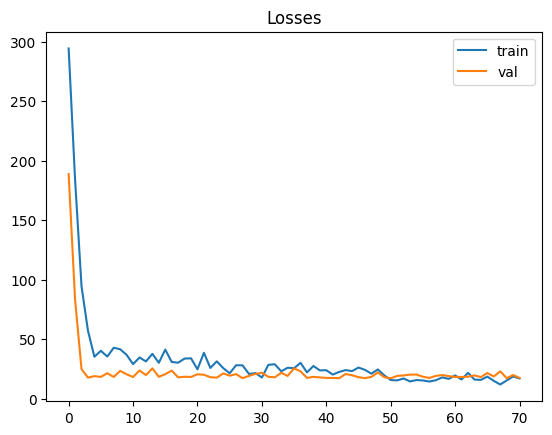

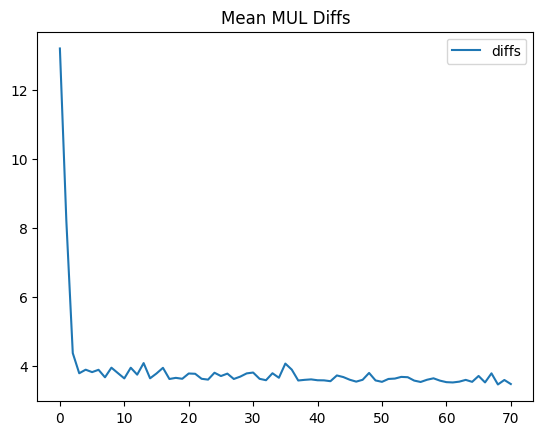

In [55]:
for k in range(1):
    plt.plot(results["train_losses"][k][0:], label=f"train")
    plt.plot(results["val_losses"][k][0:], label=f"val")
    plt.title(f"Losses")
    plt.legend()
    plt.show()

for k in range(1):
    plt.plot(results["diffs"][k][0:], label="diffs")
plt.title("Mean MUL Diffs")
plt.legend()
plt.show()

### Evaluation

Mean diff: 2.71mm
Std diff: 2.11mm


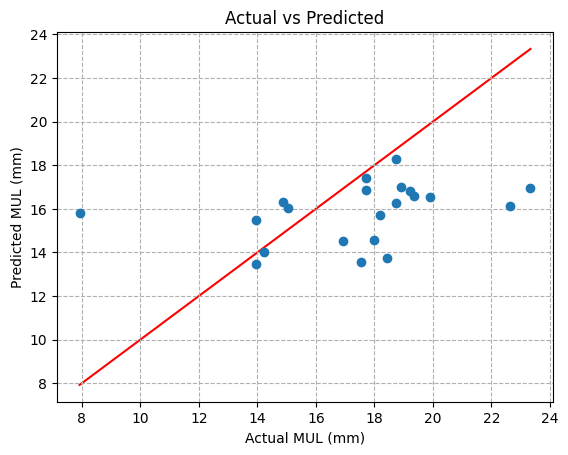

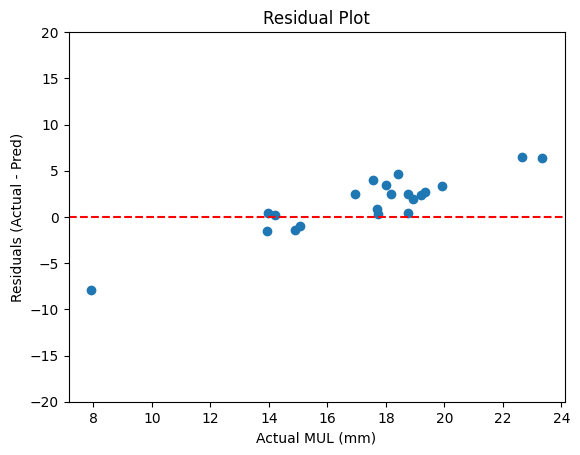

In [56]:
def evaluate_model(model, test_loader):
    images_list = []
    mul_actual_list = []
    mul_pred_list = []
    diffs_list = []

    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            images, muls = batch["image"], batch["mul"]
            # Forward pass
            outputs = model(images).squeeze(0)
            # print(muls.tolist())
            # print(outputs.tolist())

            # Convert tensors to lists or numpy arrays
            images_list.extend(images.squeeze().cpu().detach().numpy())
            mul_actual_list.extend(muls.tolist())
            mul_pred_list.extend(outputs.tolist())
            
            diffs = torch.abs(muls - outputs)
            diffs_list.extend(diffs.tolist())
    
    return images_list, mul_actual_list, mul_pred_list, diffs_list

def plot_actual_vs_predicted(y_true, y_pred):
    # Calculate plot limits
    min_val = min(min(y_true), min(y_pred))
    max_val = max(max(y_true), max(y_pred))
    
    # Plot diagonal line
    plt.plot([min_val, max_val], [min_val, max_val], color='red', zorder=1)
    
    # Plot data points
    plt.scatter(y_true, y_pred, zorder=2)
    
    # Set plot title and labels
    plt.title('Actual vs Predicted')
    plt.xlabel('Actual MUL (mm)')
    plt.ylabel('Predicted MUL (mm)')
    
    # Set dynamic y-axis limits
    # plt.xlim(min_val, max_val)
    # plt.ylim(min_val, max_val)
    
    # Add grid lines
    plt.grid(True, linestyle='--', zorder=0)
    
    # Show plot
    plt.show()

def plot_residuals(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    residuals = y_true - y_pred
    plt.scatter(y_true, residuals)
    plt.xlabel('Actual MUL (mm)')
    plt.ylabel('Residuals (Actual - Pred)')
    plt.title('Residual Plot')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.ylim(-20, 20)
    plt.show()

model.load_state_dict(torch.load("checkpoint.pt"))
images_list, mul_actual_list, mul_pred_list, diffs_list = evaluate_model(model, test_loader)
print(f"Mean diff: {np.mean(diffs_list):.2f}mm")
print(f"Std diff: {np.std(diffs_list):.2f}mm")
plot_actual_vs_predicted(mul_actual_list, mul_pred_list)
plot_residuals(mul_actual_list, mul_pred_list)


In [49]:
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

Mean diff: 3.4068043
Std diff: 2.1399927


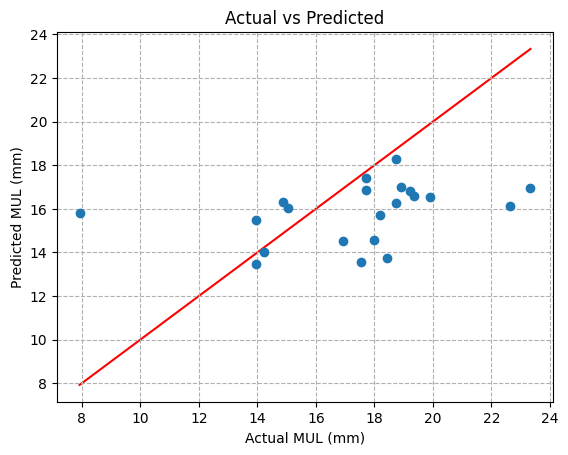

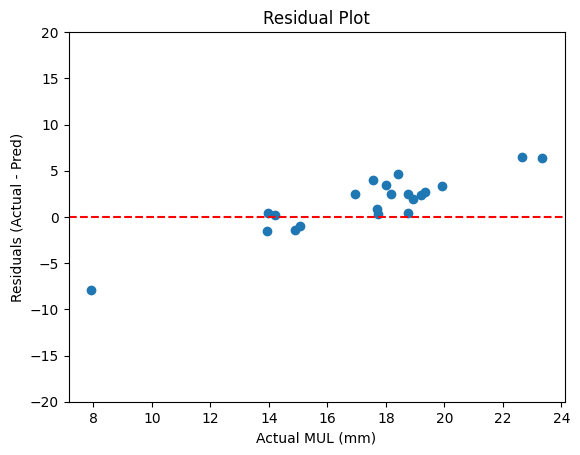

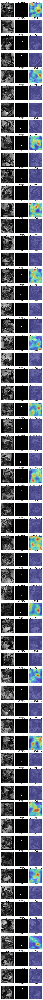

In [61]:
target_layers = [
    # model.layer1[-1],
    # model.layer2[-1],
    # model.layer3[-1],
    # model.layer4[-1],
    # model.layer4,
    model.features
    # model.base_model.decoder1.dec1conv1,
    # model.base_model.decoder1.dec1conv2,
    # model.base_model.conv,
]
cam = GradCAM(model=model, target_layers=target_layers)
# cam = GradCAMPlusPlus(model=model, target_layers=target_layers)
# cam = LayerCAM(model=model, target_layers=target_layers)

def evaluate_model(model, dataloader):
    images_list = []
    masks_list = []
    outputs_list = []
    targets_list = []
    diffs_list = []
    gradcam_list = []

    model.eval()
    for param in model.parameters():
        param.requires_grad_(True)
    for _, batch in enumerate(dataloader):
        images, masks, mul_values = batch["image"], batch["mask"], batch["mul"]
        
        # Compute Grad-CAM
        grayscale_cam = cam(input_tensor=images, targets=[BinaryClassifierOutputTarget(category=1)], aug_smooth=False, eigen_smooth=False)
        gradcam_list.extend(grayscale_cam)
        
        outputs = cam.outputs.squeeze(1)
        
        # Convert tensors to lists or numpy arrays
        images_list.extend(images.squeeze(1).cpu().detach().numpy())
        masks_list.extend(masks.squeeze(1).cpu().detach().numpy())
        outputs_list.extend(outputs.cpu().detach().numpy())
        targets_list.extend(mul_values.cpu().detach().numpy())

        diffs = torch.abs(outputs - mul_values).cpu().detach().numpy()
        diffs_list.extend(diffs)
        
        # show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    return images_list, masks_list, outputs_list, targets_list, diffs_list, gradcam_list

def visualize_results(images_list, masks_list, outputs_list, targets_list, diffs_list, gradcam_list):
    num_images = len(images_list)
    fig, axs = plt.subplots(num_images, 3, figsize=(8, 3 * num_images))

    for i in range(num_images):
        # print(images_list[i].shape)
        axs[i, 0].set_title(f"Image")
        axs[i, 0].imshow(images_list[i].transpose(1, 2, 0), cmap="gray")

        axs[i, 1].set_title(f"Actual Mask\nGT MUL: {targets_list[i]:.2f}")
        axs[i, 1].imshow(masks_list[i], cmap="gray")
        
        axs[i, 2].set_title(f"Grad-CAM\nPred MUL: {outputs_list[i]:.2f} / Diff: {diffs_list[i]:.2f}")
        axs[i, 2].imshow(images_list[i].transpose(1, 2, 0), cmap="gray", alpha=0.5)
        axs[i, 2].imshow(gradcam_list[i], cmap="jet", alpha=0.5)

    for row in axs:
        for ax in row:
            ax.axis("off")
    plt.tight_layout()
    plt.show()

def plot_actual_vs_predicted(y_true, y_pred):
    # Calculate plot limits
    min_val = min(min(y_true), min(y_pred))
    max_val = max(max(y_true), max(y_pred))
    
    # Plot diagonal line
    plt.plot([min_val, max_val], [min_val, max_val], color='red', zorder=1)
    
    # Plot data points
    plt.scatter(y_true, y_pred, zorder=2)
    
    # Set plot title and labels
    plt.title('Actual vs Predicted')
    plt.xlabel('Actual MUL (mm)')
    plt.ylabel('Predicted MUL (mm)')
    
    # Set dynamic y-axis limits
    # plt.xlim(min_val, max_val)
    # plt.ylim(min_val, max_val)
    
    # Add grid lines
    plt.grid(True, linestyle='--', zorder=0)
    
    # Show plot
    plt.show()

def plot_residuals(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    residuals = y_true - y_pred
    plt.scatter(y_true, residuals)
    plt.xlabel('Actual MUL (mm)')
    plt.ylabel('Residuals (Actual - Pred)')
    plt.title('Residual Plot')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.ylim(-20, 20)
    plt.show()


eval_loader = train_loader
images_list, masks_list, outputs_list, targets_list, diffs_list, gradcam_list = evaluate_model(model, eval_loader)

print("Mean diff:", np.mean(diffs_list))
print("Std diff:", np.std(diffs_list))

plot_actual_vs_predicted(mul_actual_list, mul_pred_list)
plot_residuals(mul_actual_list, mul_pred_list)
visualize_results(images_list, masks_list, outputs_list, targets_list, diffs_list, gradcam_list)
